In [1]:
import scipy
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import seaborn.objects as so

from ete3 import TreeStyle, Tree, TextFace, add_face_to_node

sc.set_figure_params(dpi=300, scanpy=True)
sc.settings.verbosity = 3
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import os
# change it according to your preferences
DATA_DIR = "/n/groups/kirschner/xenopus/old_atlas"
NF_stage = "S14"
# adata_kotov_fp = os.path.join(DATA_DIR, "GSE198491_matrix.h5ad")
# adata_train_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.kNN.h5ad")
adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.h5ad")
# adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")


os.environ['QT_QPA_PLATFORM']='offscreen'

In [3]:
import sys
sys.path.append("/home/ksp503/projs/xenopus/notebooks")

from little import *

In [4]:
# adata.uns['log1p']["base"] = None

# DE marker gene determination for Briggs cell types

In [4]:
adata = sc.read_h5ad(adata_fp)
adata.var

,gene_name,human_id,human_name,human_desc,eval_forward,eval_backward,mt,ribo,n_cells_by_counts,mean_counts,...,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
XBXT10g000001,nsfl1c,sp|Q9UNZ2|NSF1C_HUMAN,NSFL1C,NSFL1 cofactor p47,4.900000e-171,6.200000e-171,False,False,1452,0.020992,...,98.156050,1653.0,7.410952,1452,False,NaN,0.029159,0.038280,0.837369,0
XBXT10g000002,clul1,sp|Q15846|CLUL1_HUMAN,CLUL1,Clusterin-like protein 1,1.300000e-65,1.300000e-65,False,False,79,0.001079,...,99.899675,85.0,4.454347,79,True,1073.0,0.001424,0.001699,1.034816,1
XBXT10g000003,vwc2l,sp|B2RUY7|VWC2L_HUMAN,VWC2L,von Willebrand factor C domain-containing prot...,1.000000e-125,1.100000e-125,False,False,128,0.001816,...,99.837448,143.0,4.969813,128,False,1960.0,0.002611,0.003435,1.036739,2
XBXT10g000004,slc47a1,sp|Q96FL8|S47A1_HUMAN,SLC47A1,Multidrug and toxin extrusion protein 1,2.400000e-156,NaN,False,False,74,0.000952,...,99.906025,75.0,4.330733,74,False,2832.0,0.001424,0.001462,0.919214,1
XBXT10g000005,ikbkg,sp|Q9Y6K9|NEMO_HUMAN,IKBKG,NF-kappa-B essential modulator,3.100000e-84,4.300000e-83,False,False,915,0.013995,...,98.838007,1102.0,7.005789,915,False,2650.0,0.021009,0.029589,0.913275,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XBXT10g029550,LOC105945311,sp|P41180|CASR_HUMAN,CASR,Extracellular calcium-sensing receptor,5.100000e-123,NaN,False,False,4,0.000051,...,99.994920,4.0,1.609438,4,False,NaN,0.000079,0.000079,0.424873,0
XBXT10g029560,LOC116406866,sp|Q9UBG3|CRNN_HUMAN,CRNN,Cornulin,1.300000e-08,NaN,False,False,21,0.000279,...,99.973331,22.0,3.135494,21,False,2830.0,0.000415,0.000455,0.850664,1
XBXT10g029565,LOC116412448,NaN,NaN,NaN,NaN,NaN,False,False,23,0.000343,...,99.970791,27.0,3.332205,23,False,1739.0,0.000514,0.000712,1.107274,2
XBXT10g029569,LOC105945488,NaN,NaN,NaN,NaN,NaN,False,False,59,0.000800,...,99.925074,63.0,4.158883,59,True,1296.0,0.001147,0.001344,1.025228,1


In [5]:
REF_DIR = "/n/groups/kirschner/xenopus/reference/Xentr10.0"

gtf_ids = pd.read_csv(os.path.join(REF_DIR, "XENTR_10.0_Xenbase.names.tsv"), sep="\t")
gtf_ids[["eval_forward", "eval_backward"]] = gtf_ids[["eval_forward", "eval_backward"]].astype(float)
gtf_ids_unique = gtf_ids.sort_values("eval_forward").drop_duplicates("gene_id")
cols = ["gene_name", "human_id", "human_name", "human_desc", "eval_forward", "eval_backward"]
adata.var[cols] = gtf_ids_unique.set_index("gene_id").loc[adata.var_names, cols].values
adata.var[["eval_forward", "eval_backward"]] = adata.var[["eval_forward", "eval_backward"]].astype(float)

In [7]:
adata.raw = adata.copy()

In [6]:
unlabeled = "Unlabeled"

reannotate_dict = {
    "germ cell": unlabeled,
    "Unknown": unlabeled,
    "Outlier": unlabeled,
}

train_target_long = "Celltype_transferred"
# adata_train.obs[train_target] = adata_train.obs["Celltype_transferred"].astype("str")
# adata_train.obs.loc[~adata_train.obs.consistent, train_target] = "Unknown"

train_target = f"{train_target_long}_short"
adata.obs[train_target] = adata.obs[train_target_long].str.replace(f"{NF_stage}-", "")
adata.obs[train_target] = adata.obs[train_target].astype("category")

celltype_barcode = "Celltype_barcode"
adata.obs[celltype_barcode] = adata.obs[train_target]

adata.obs[train_target] = [reannotate_dict[ct] if ct in reannotate_dict else ct for ct in adata.obs[train_target]]
adata.obs[train_target] = adata.obs[train_target].astype("category")

In [7]:
adata.obs.lib.value_counts()

lib
S14_2_3       17440
S14_2_1       13343
S14_2_2        9845
SRR7061443     4094
SRR7061442     2962
SRR7061441     1622
SRR7061444     1244
Name: count, dtype: int64

In [8]:
ncells = 3
nUMI_per_cell = 300
ngenes_per_cell = 100

adata = adata[:, adata.var.n_cells >= ncells]
adata = adata[(adata.obs.nUMI_per_cell > nUMI_per_cell) & (adata.obs.ngenes_per_cell > ngenes_per_cell), :]

In [9]:
adata.obs.lib.value_counts()

lib
S14_2_3       5665
S14_2_1       3462
SRR7061443    3340
S14_2_2       3076
SRR7061442    1959
SRR7061441    1334
SRR7061444    1115
Name: count, dtype: int64

In [10]:
adata.obs_names_make_unique()

In [37]:
# adata = adata.raw.to_adata()

In [38]:
sc.experimental.pp.recipe_pearson_residuals(adata, n_top_genes=3000, theta=10, batch_key="Library_name", n_comps=20)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
computing analytic Pearson residuals on adata.X
    finished (0:00:01)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:02)


In [39]:
adata.raw = adata.copy()

In [40]:
sc.pp.normalize_total(adata, target_sum=1e3)
sc.pp.log1p(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

normalizing counts per cell
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


In [41]:
res = 2
cur_leiden = f"leiden_{res}"
sc.tl.leiden(adata, resolution=res, key_added=cur_leiden)

running Leiden clustering
    finished: found 45 clusters and added
    'leiden_2', the cluster labels (adata.obs, categorical) (0:00:02)


/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


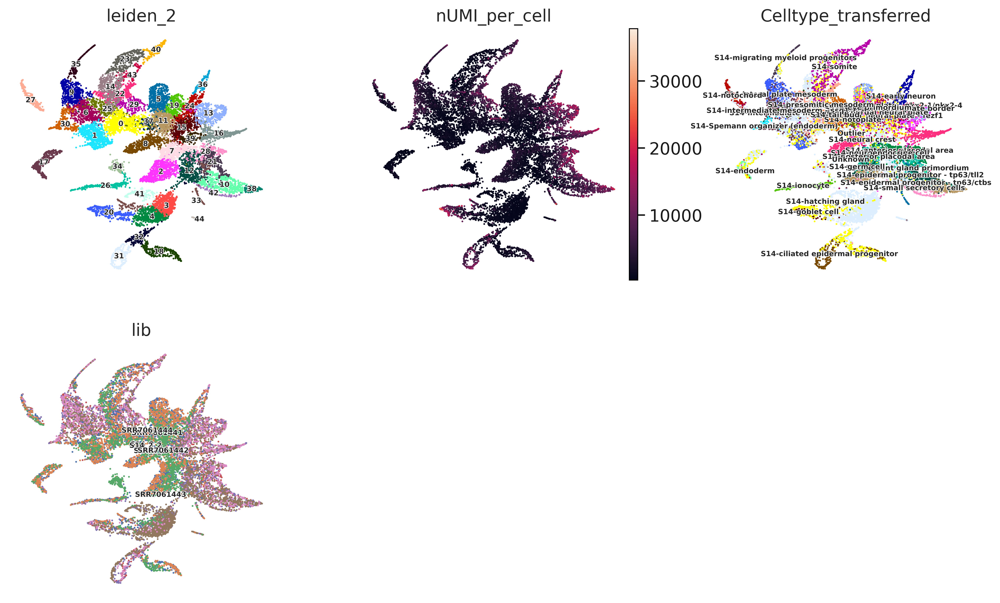

In [42]:
sc.set_figure_params(dpi=200)
sc.pl.umap(
    adata,
    color=[cur_leiden, "nUMI_per_cell", "Celltype_transferred", "lib"],
    legend_loc="on data",
    legend_fontsize=6,
    legend_fontoutline=1,
    frameon=False,
    ncols=3,
)

# Cell type prediction

In [43]:
infer_groups = [unlabeled, ]
adata_test = adata 
adata_train = adata[~adata.obs[train_target].isin(infer_groups)]

In [44]:
adata.var["gene_id"] = adata.var_names.to_series()

In [45]:
p_adj = 0.05
method = "wilcoxon"
pct = 0.2
n_top = 30
use_raw = False
logfoldchange = 0
labels = adata_train.obs[train_target].cat.categories
gene_symbols = "gene_id"

de_params = {
    "log_foldchange": logfoldchange,
    "p_adj": p_adj,
    "method": method,
    "n_top": n_top,
    "pct": pct
}

celltype_collection = get_celltype_collection(adata_train, train_target, de_params)
celltype_gsea_results = run_GSEA(adata_test, cur_leiden, de_params, gene_symbols, celltype_collection)

celltype_by_cluster = {
    cluster: celltype_gsea_results[cluster].sort_values(["score"]).iloc[-1,:] \
        for cluster in adata_test.obs[cur_leiden].cat.categories
    }

predicted_best = [celltype_by_cluster[cluster].name for cluster in adata_test.obs[cur_leiden]]

ranking genes


/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:42)
neural crest 30
migrating myeloid progenitors 30
epidermal progenitor - tp63/tll2 30
presomitic mesoderm 30
notochord 30
lateral plate mesoderm 30
intermediate mesoderm 30
ionocyte 30
tail bud 30
ciliated epidermal progenitor 30
cement gland primordium 30
chordal neural plate border 30
posterior placodal area 30
intermediate mesoderm - ssg1 30
chordal neural plate 30
anterior neural plate - nkx2-1/nkx2-4 30
early neuron 30
epidermal progenitor - tp63/ctbs 30
anterior placodal area 30
somite 30
Spemann organizer (endoderm) 30
endoderm 30
anterior neural plate - fezf1 30
eye primordium 30
notoplate 30
small secretory cells 3

### celltype scores by cluster:

In [46]:
celltypes_by_cluster = {
    celltype: {
        cluster: celltype_gsea_results[cluster].loc[celltype, "norm"] \
        for cluster in adata_test.obs[cur_leiden].cat.categories
    }
    for celltype in celltype_collection.geneset.unique()
    }

for celltype, cluster_scores in celltypes_by_cluster.items():
    adata.obs[celltype] = [cluster_scores[cluster] for cluster in adata.obs[cur_leiden]]

### celltype best by cluster:

In [47]:
inferred_target = "Celltype_by_cluster"
adata.obs[inferred_target] = predicted_best
adata.obs[inferred_target] = adata.obs[inferred_target].astype("category")

In [48]:
crosstab = pd.crosstab(adata.obs[celltype_barcode], adata.obs[inferred_target])
crosstab = crosstab.div(crosstab.sum(axis=1), axis=0)

In [49]:
sc.tl.dendrogram(adata, groupby=celltype_barcode, use_rep="X_pca")
row_linkage = adata.uns[f"dendrogram_{celltype_barcode}"]["linkage"]

sc.tl.dendrogram(adata, groupby=inferred_target, use_rep="X_pca")
column_linkage = adata.uns[f"dendrogram_{inferred_target}"]["linkage"]

Storing dendrogram info using `.uns['dendrogram_Celltype_barcode']`
Storing dendrogram info using `.uns['dendrogram_Celltype_by_cluster']`


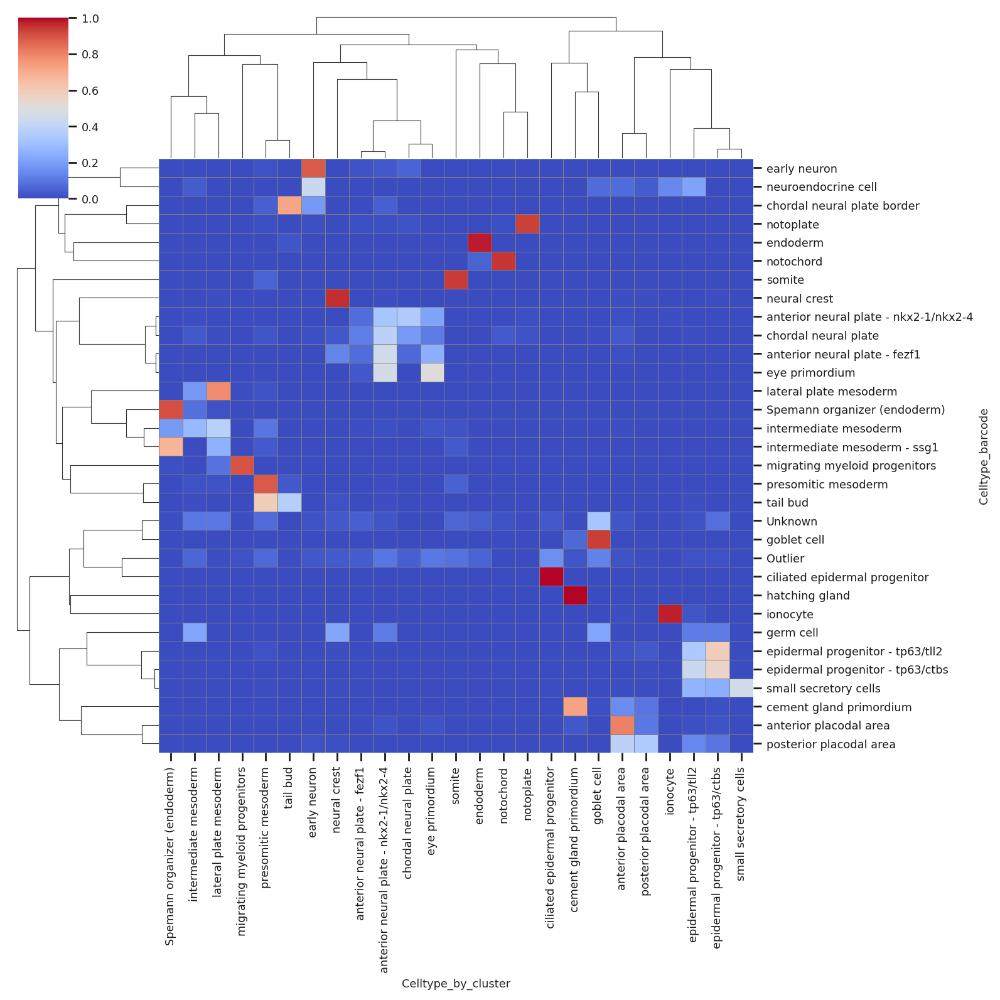

In [50]:
with sns.axes_style("ticks"):
    sc.set_figure_params(scanpy=True, fontsize=8)
    # fig, ax = plt.subplots(figsize=(8, 8))
    # g = sns.heatmap(
    g = sns.clustermap(
        crosstab,
        cmap="coolwarm",
        yticklabels=adata.obs[celltype_barcode].cat.categories,
        xticklabels=adata.obs[inferred_target].cat.categories,
        row_linkage=row_linkage,
        col_linkage=column_linkage,
        # ax=ax,
        linewidths=.3,
    #     row_cluster=False,
        linecolor='grey',
    #     square=True,
        # cbar_pos=(0.05, 0.87, 0.025, 0.1)
    #     cbar=False,
    )

In [51]:
abundance_table = pd.concat(
    [
        adata_train.obs[train_target].value_counts(),
        adata.obs[inferred_target].value_counts()
    ],
    axis=1
)
abundance_table.columns = [train_target, inferred_target]
abundance_table = abundance_table.fillna(0).astype(int)
abundance_table

,Celltype_transferred_short,Celltype_by_cluster
neural crest,724,960
posterior placodal area,595,300
epidermal progenitor - tp63/ctbs,589,1056
chordal neural plate,558,308
intermediate mesoderm,501,800
presomitic mesoderm,500,1219
somite,471,880
lateral plate mesoderm,470,1013
anterior placodal area,430,753
epidermal progenitor - tp63/tll2,426,637


In [52]:
abundance_table.sum(axis=0)

Celltype_transferred_short     8229
Celltype_by_cluster           14214
dtype: int64

# Leiden cluster annotation with Briggs DE gene markers

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


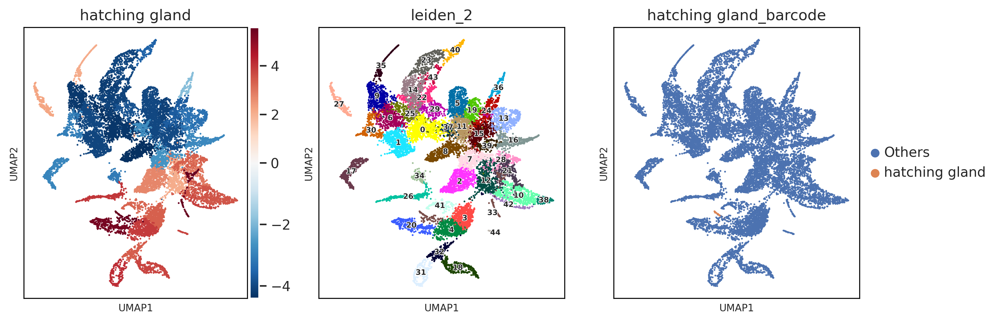

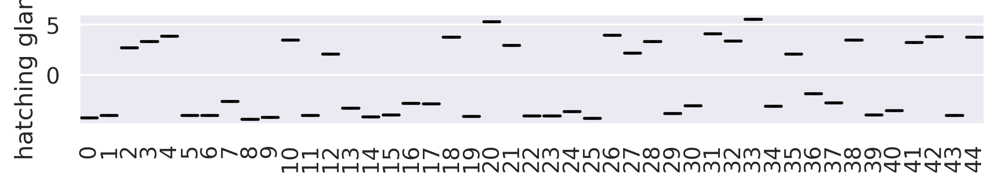

In [56]:
sc.set_figure_params(dpi=150, scanpy=True, fontsize=8)
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
ct = f'hatching gland'
ct_barcode = ct + "_barcode"

adata.obs[ct_barcode] = adata.obs[celltype_barcode] == ct
adata.obs.loc[adata.obs[ct_barcode], ct_barcode] = ct
adata.obs.loc[~adata.obs[ct_barcode].astype(bool), ct_barcode] = "Others"

sns.set(font_scale = 1)
sc.pl.umap(
    adata, color=ct, cmap='RdBu_r', vcenter=0, legend_loc="on data", legend_fontsize=6,
    legend_fontoutline=1, ax=axs[0], show=False)

sc.pl.umap(
    adata, color=cur_leiden, legend_loc="on data", legend_fontsize=6,
    legend_fontoutline=1, ax=axs[1], show=False)

sc.pl.umap(
    adata, color=ct_barcode, ax=axs[2])

fig, ax = plt.subplots(figsize=(8, 1))
# sns.set(font_scale = 0.3)
ax = sc.pl.violin(adata, keys=[ct], groupby=cur_leiden, rotation=90, ax=ax)

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


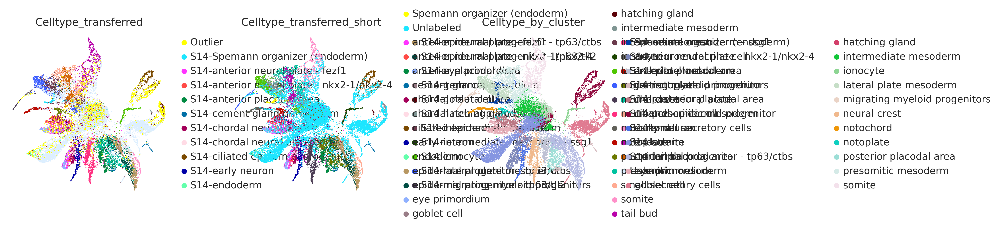

In [27]:
sc.set_figure_params(dpi=150, scanpy=True)

sc.pl.umap(
    adata,
    color=["Celltype_transferred", train_target,  inferred_target], 
    frameon=False,
)

# Checkpoint

In [24]:
adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")
adata.write(adata_fp)

In [29]:
# # restore 
# adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")
# adata = sc.read_h5ad(adata_fp)

inferred_target = "Celltype_by_cluster"
train_target_long = "Celltype_transferred"
train_target = f"{train_target_long}_short"
gene_symbols = "gene_id"

adata.uns['log1p']['base'] = None

In [30]:
adata

AnnData object with n_obs × n_vars = 14214 × 22702
    obs: 'lib', 'nUMI_per_cell', 'ngenes_per_cell', 'inDrops_version', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'cell_barcode', 'cell_barcode_v', 'Library_name', 'barcodes_unique', 'Celltype_transferred', 'Celltype_known', 'Celltype_transferred_short', 'Celltype_barcode', 'leiden_2', 'neural crest', 'migrating myeloid progenitors', 'epidermal progenitor - tp63/tll2', 'presomitic mesoderm', 'notochord', 'lateral plate mesoderm', 'intermediate mesoderm', 'ionocyte', 'tail bud', 'ciliated epidermal progenitor', 'cement gland primordium', 'chordal neural plate border', 'posterior placodal area', 'intermediate mesoderm - ssg1', 'chordal neural plate'

# Assessment of annotation of clusters
- celltype entropy -> undetermined cluster
- number of strong marker genes ~ cluster goodness
- fraction of celltype max -> subtype?

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


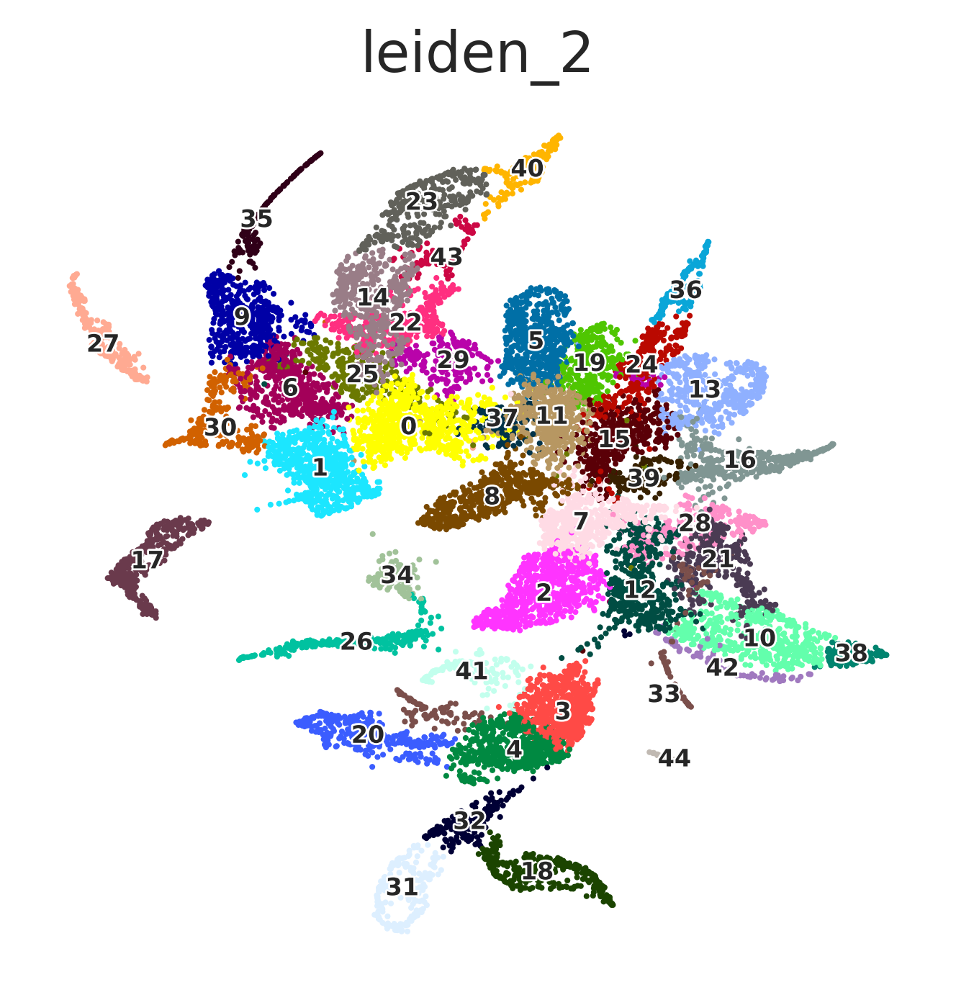

In [57]:
# res = 2
# cur_leiden = f"leiden_{res}"
# sc.tl.leiden(adata, resolution=res, key_added=cur_leiden)
sc.set_figure_params(dpi=200)
sc.pl.umap(
    adata,
    color=cur_leiden,
    legend_loc="on data",
    legend_fontsize=6,
    legend_fontoutline=1,
    frameon=False,
)

In [58]:
celltypes_vs_clusters_unnorm = pd.crosstab(
    adata.obs[inferred_target],
    adata.obs[cur_leiden],
    dropna=False
)
celltypes_vs_clusters_by_celltype = celltypes_vs_clusters_unnorm.values / celltypes_vs_clusters_unnorm.values.sum(axis=1, keepdims=True)
celltypes_vs_clusters_by_cluster = celltypes_vs_clusters_unnorm.values / celltypes_vs_clusters_unnorm.values.sum(axis=0, keepdims=True)

In [59]:
method = "wilcoxon"

sc.tl.rank_genes_groups(adata, cur_leiden, method=method, use_raw=False, key_added=cur_leiden, pts=True, gene_symbols=gene_symbols)

ranking genes
    finished: added to `.uns['leiden_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:14)


In [60]:
cluster_marker_genes = {}

logfoldchange = 2
p_adj = 0.05
pct = 0.5

for cluster in adata.obs[cur_leiden].cat.categories:
    mg_df = sc.get.rank_genes_groups_df(adata, group=cluster, key=cur_leiden)
    mg_df = mg_df.loc[(mg_df.logfoldchanges > logfoldchange) & (mg_df.pvals_adj < p_adj) & (mg_df.pct_nz_group > pct)]
    cluster_marker_genes[cluster] = mg_df

In [61]:
cluster2cell_type = pd.DataFrame(
    {
        "cluster": adata.obs[cur_leiden].cat.categories,
        "celltype_max":  adata.obs[inferred_target].cat.categories[celltypes_vs_clusters_by_cluster.argmax(axis=0)],
        "celltype_max_frac": celltypes_vs_clusters_by_celltype[celltypes_vs_clusters_by_cluster.argmax(axis=0)].diagonal(),
        "celltype_entropy": scipy.stats.entropy(celltypes_vs_clusters_by_cluster, axis=0),
        f"mg_num_{logfoldchange}_{p_adj}_{pct}": [cluster_marker_genes[cluster].shape[0] for cluster in adata.obs[cur_leiden].cat.categories]
    }
)

In [62]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    display(cluster2cell_type.sort_values("celltype_max_frac"))

,cluster,celltype_max,celltype_max_frac,celltype_entropy,mg_num_2_0.05_0.5
44,44,goblet cell,0.019,0.0,6
41,41,goblet cell,0.074,0.0,10
43,43,somite,0.092,0.0,92
38,38,epidermal progenitor - tp63/ctbs,0.121,0.0,144
39,39,neural crest,0.129,0.0,0
40,40,somite,0.141,0.0,209
20,20,goblet cell,0.186,0.0,218
25,25,presomitic mesoderm,0.202,0.0,0
34,34,intermediate mesoderm,0.203,0.0,0
22,22,presomitic mesoderm,0.244,0.0,25


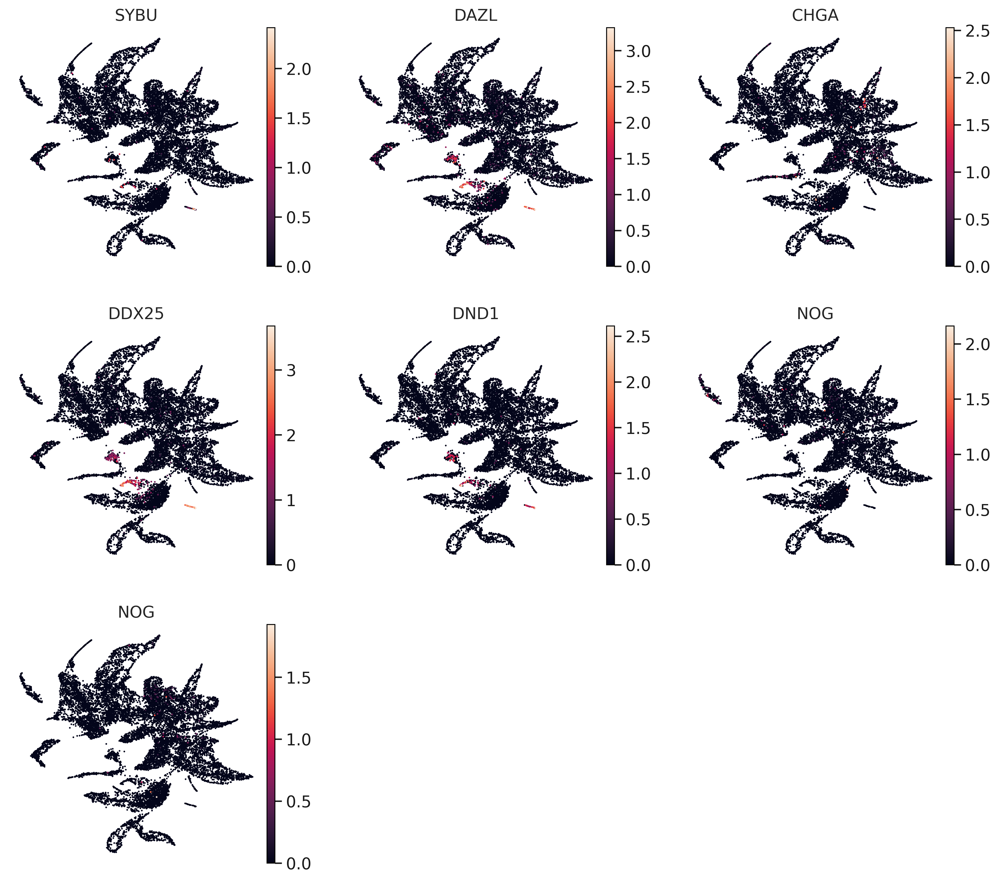

In [65]:
genes = ["ddx25", "dazl", "sybu", "dnd1", "nog", "nog2", "chga"]
color = adata.var_names[adata.var["gene_name"].isin(genes)]
names = adata.var.loc[adata.var["gene_name"].isin(genes), "human_name"]
sc.pl.umap(adata, color=color, frameon=False, ncols=3, use_raw=False, title=names)

# Cluster explore

In [40]:
sc.tl.rank_genes_groups(
    adata, cur_leiden, method='wilcoxon', use_raw=False, gene_symbols=gene_symbols, key_added=cur_leiden
)

ranking genes
    finished: added to `.uns['leiden_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:10)


In [50]:
groups = ["16", ]
reference = "13"
key_added = f"{','.join(groups)} vs {reference}"

In [51]:
sc.tl.rank_genes_groups(
    adata, cur_leiden, method='wilcoxon', use_raw=False,
    groups=groups,
    reference=reference,
    key_added=key_added
)

ranking genes
    finished: added to `.uns['16 vs 13']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [67]:
gene_name = "gene_name_display"
adata.var[gene_name] = adata.var.gene_id.astype("str")
idx = ~adata.var.gene_name.isna()
adata.var.loc[idx, gene_name] += "|" + adata.var.loc[idx, "gene_name"].astype("str")
idx = ~adata.var.human_name.isna()
adata.var.loc[idx, gene_name] += "|" + adata.var.loc[idx, "human_name"].astype("str")

adata.var[gene_name]

XBXT10g000001        XBXT10g000001|nsfl1c|NSFL1C
XBXT10g000002          XBXT10g000002|clul1|CLUL1
XBXT10g000003          XBXT10g000003|vwc2l|VWC2L
XBXT10g000004      XBXT10g000004|slc47a1|SLC47A1
XBXT10g000005          XBXT10g000005|ikbkg|IKBKG
                              ...               
XBXT10g029550    XBXT10g029550|LOC105945311|CASR
XBXT10g029560    XBXT10g029560|LOC116406866|CRNN
XBXT10g029565         XBXT10g029565|LOC116412448
XBXT10g029569         XBXT10g029569|LOC105945488
XBXT10g029573         XBXT10g029573|LOC105947954
Name: gene_name_display, Length: 22702, dtype: object

In [39]:
gene_symbols = "gene_name_display"
marker_genes = sc.get.rank_genes_groups_df(adata, group=groups, gene_symbols=gene_symbols, key=key_added)

NameError: name 'groups' is not defined

In [ ]:
sc.set_figure_params(dpi=150)
ntop = nbottom = 5
use_raw = True

adata.obs["cur_cluster"] = "others"

marker_genes_top = []
marker_genes_bottom = []
marker_genes_top_symbols = []
marker_genes_bottom_symbols = []

if len(groups) > 1:
    for group in groups:
        adata.obs.loc[adata.obs[cur_leiden] == group, "cur_cluster"] = f"group_{group}"
        marker_genes_top += list(marker_genes.loc[marker_genes.group == group, "names"][:ntop])
        marker_genes_top_symbols += list(marker_genes.loc[marker_genes.group == group, gene_symbols][:ntop])
        marker_genes_bottom += list(marker_genes.loc[marker_genes.group == group, "names"][-nbottom:])
        marker_genes_bottom_symbols += list(marker_genes.loc[marker_genes.group == group, gene_symbols][-nbottom:])
else:
    adata.obs.loc[adata.obs[cur_leiden] == groups[0], "cur_cluster"] = f"group_{groups[0]}"
    marker_genes_top += list(marker_genes["names"][:ntop])
    marker_genes_top_symbols += list(marker_genes[gene_symbols][:ntop])
    marker_genes_bottom += list(marker_genes["names"][-nbottom:])
    marker_genes_bottom_symbols += list(marker_genes[gene_symbols][-nbottom:])
    
adata.obs.loc[adata.obs[cur_leiden] == reference, "cur_cluster"] = f"reference_{reference}"

    
colors = ["cur_cluster"] + marker_genes_top + marker_genes_bottom 
titles = [key_added] + marker_genes_top_symbols + marker_genes_bottom_symbols

sc.pl.umap(
    adata,
    color=colors,
    title=titles,
    frameon=False,
    ncols=3,
    use_raw=use_raw
#     vmax=[30, 10, 40, 20]
)

In [51]:
adata.obs.loc[adata.obs[cur_leiden].isin(groups+[reference,]), [cur_leiden, celltype_barcode]].value_counts().sort_index()

leiden_3  Celltype_barcode                 
19        S18-chordal neural crest              80
          S18-cranial neural crest             276
          Unknown                                2
53        Outlier                                1
          S18-anterior placodal area             1
          S18-chordal neural crest               5
          S18-cranial neural crest              79
          S18-endoderm / foregut primordium      1
          Unknown                                4
Name: count, dtype: int64

In [ ]:
def find_genes(adata, names_column, gene_names):
    id_2_name = {}
    
    for gene in gene_names:
        genes = adata.var.loc[adata.var[names_column].str.contains(gene, case=False, na=False), :]
        for i, gene in genes.iterrows():
            id_2_name[i] = gene[names_column]
    
    return id_2_name

In [72]:
gene_symbols = "gene_name_display"
cluster = "33"
marker_genes = sc.get.rank_genes_groups_df(adata, group=cluster, gene_symbols=gene_symbols, key=cur_leiden)

In [29]:
bad_clusters = [str(i) for i in [0, 1, 3, 4, 8, 14, 24, 42]]

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


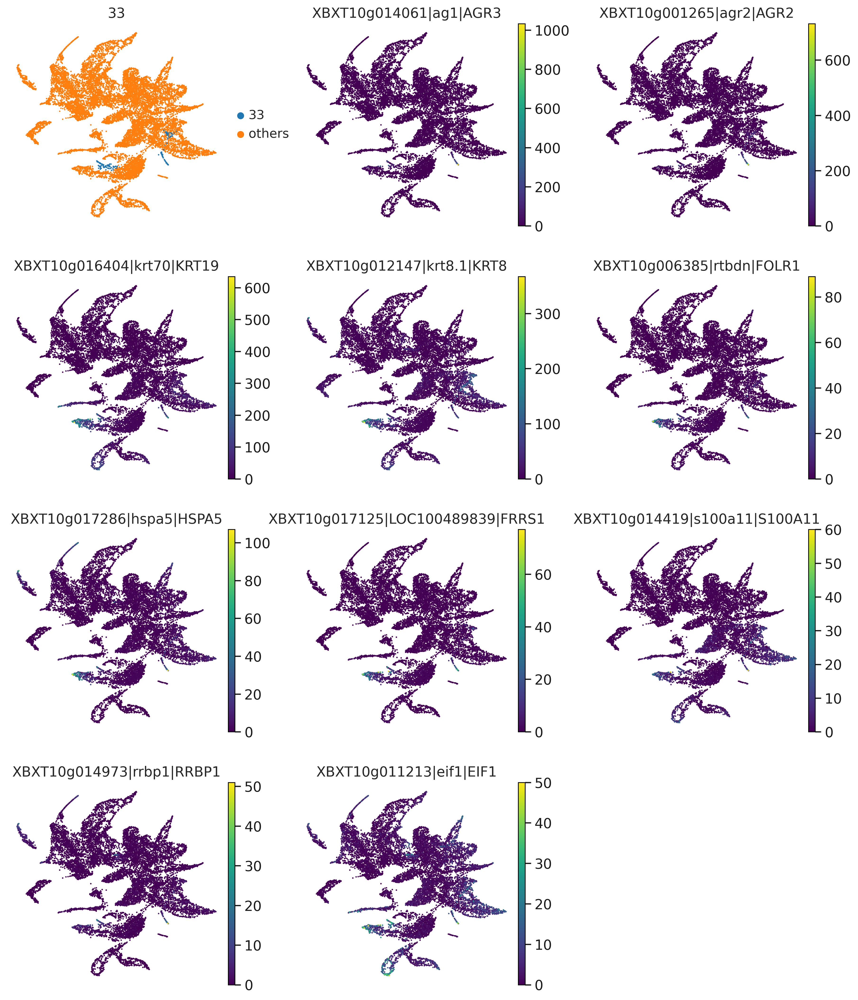

In [73]:
%matplotlib inline
sc.set_figure_params(dpi=150, scanpy=True)
num_genes = 10

adata.obs["cur_cluster"] = "others"
adata.obs.loc[adata.obs[cur_leiden] == cluster, "cur_cluster"] = cluster
colors = ["cur_cluster"] + list(marker_genes.iloc[0:num_genes, 0])
titles = [cluster] + list(marker_genes[gene_symbols].iloc[0:num_genes])

sc.pl.umap(
    adata,
    color=colors,
    title=titles,
    frameon=False,
    ncols=3,
    use_raw=True,
    cmap='viridis',
)

## GSEA

In [52]:
import decoupler
msigdb = decoupler.get_resource("MSigDB")
msigdb.collection.unique()
cell_type_signatures = msigdb.query("collection == 'cell_type_signatures'").copy()
go_molecular_function = msigdb.query("collection == 'go_molecular_function'").copy()
reactome = msigdb.query("collection == 'reactome_pathways'").copy()

In [66]:
cur_collection = cell_type_signatures
cur_collection.drop_duplicates(["genesymbol", "geneset"], inplace=True)
cur_collection

,genesymbol,collection,geneset
31,MAFF,cell_type_signatures,DURANTE_ADULT_OLFACTORY_NEUROEPITHELIUM_RESPIR...
41,MAFF,cell_type_signatures,FAN_OVARY_CL9_PUTATIVE_APOPTOTIC_ENDOTHELIAL_CELL
89,MAFF,cell_type_signatures,FAN_OVARY_CL17_PUTATIVE_APOPTOTIC_SMOOTH_MUSCL...
95,MAFF,cell_type_signatures,ZHENG_CORD_BLOOD_C5_SIMILAR_TO_HSC_C6_PUTATIVE...
97,MAFF,cell_type_signatures,HAY_BONE_MARROW_NK_CELLS
...,...,...,...
3837652,KDM5D,cell_type_signatures,HE_LIM_SUN_FETAL_LUNG_C7_PROLIFERATING_SCHWANN...
3837919,PRSS3P2,cell_type_signatures,MURARO_PANCREAS_ACINAR_CELL
3838132,GSTT1,cell_type_signatures,CUI_DEVELOPING_HEART_COMPACT_VENTRICULAR_CARDI...
3838235,GSTT1,cell_type_signatures,FAN_EMBRYONIC_CTX_BIG_GROUPS_CAJAL_RETZIUS


In [67]:
geneset_size = cur_collection.groupby("geneset").size()
cur_collection_genesets = geneset_size.index[(geneset_size > 5) & (geneset_size < 500)]

In [68]:
t_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, cluster, key=cur_leiden, gene_symbols="human_gene_symbol")
    # Subset to highly variable genes
    .set_index("human_gene_symbol")
#     .loc[adata_kotov_s22.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis([cur_leiden], axis=1)
)
t_stats

leiden_1,scores
human_gene_symbol,
SHOX,8.065987
IGF1R,8.064615
KIAA0825,8.043684
MACF1,8.026241
ITFG2,7.845480
...,...
HTR2B,-0.000798
RAB18,-0.000434
RPS13,-0.000399


In [69]:
scores, norm, pvals = decoupler.run_gsea(
    t_stats.T,
    cur_collection[cur_collection["geneset"].isin(cur_collection_genesets)],
    source="geneset",
    target="genesymbol"
)

gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/seaborn/_core/plot.py:941: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.savefig(buffer, dpi=dpi * 2, format="png", bbox_inches="tight")


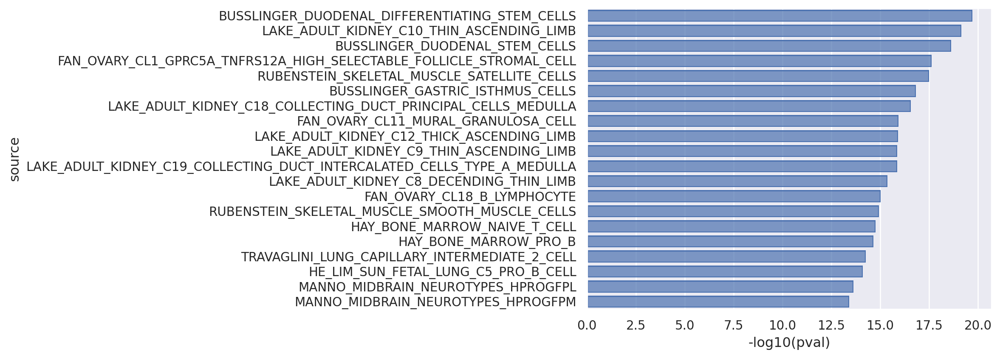

In [70]:
(
    so.Plot(
        data=(
            gsea_results.loc[(gsea_results.pval < 0.05) & (gsea_results.score > 0), :].sort_values("pval", ascending=True).head(20).assign(
                **{"-log10(pval)": lambda x: -np.log10(x["pval"])}
            )
        ),
        x="-log10(pval)",
        y="source",
    ).add(so.Bar())
)

In [71]:
gsea_results.loc[(gsea_results.pval < 0.05) & (gsea_results.score > 0), :].sort_values("score", ascending=False).head(40)

,score,norm,pval
source,,,
GAO_LARGE_INTESTINE_ADULT_CF_GOBLET_CELL_SUBTYPE_1,0.879553,2.089008,3.670697e-02
BUSSLINGER_DUODENAL_MX_CELLS,0.843716,2.030245,4.233161e-02
HAY_BONE_MARROW_CD34_POS_EO_B_MAST,0.777737,2.041155,4.123539e-02
MENON_FETAL_KIDNEY_0_CAP_MESENCHYME_CELLS,0.775081,5.203659,1.954029e-07
BUSSLINGER_GASTRIC_PPP1R1B_POSITIVE_CELLS,0.765894,6.320756,2.602860e-10
BUSSLINGER_GASTRIC_LYZ_POSITIVE_CELLS,0.765007,6.034972,1.589901e-09
HE_LIM_SUN_FETAL_LUNG_C3_DEFINITIVE_ERYTHROCYTE,0.751773,1.977369,4.799998e-02
MANNO_MIDBRAIN_NEUROTYPES_BASAL,0.750690,5.748302,9.014413e-09
DESCARTES_MAIN_FETAL_UNIPOLAR_BRUSH_CELLS,0.750314,2.094050,3.625549e-02


# Discard some clusters

In [30]:
adata.shape

(19951, 22702)

In [31]:
# bad_clusters = ["0", ]
adata = adata[~adata.obs[cur_leiden].isin(bad_clusters), :]
# acts = acts[~acts.obs[cur_leiden].isin(bad_clusters), :]

In [32]:
adata.shape

(14214, 22702)

# Reannotation

In [33]:
train_target, inferred_target

('Celltype_transferred_short', 'Celltype_by_cluster')

In [74]:
cluster_celltype = {
    "41": "germ cell",
    "44": "germ cell",
    "29": "chordal neural plate border",
    "33": "hatching gland"
    # "27": "somite"
}

adata.obs[inferred_target] = adata.obs[inferred_target].astype("str")

for cluster, cell_type in cluster_celltype.items():
    adata.obs.loc[adata.obs[cur_leiden] == cluster, inferred_target] = cell_type
    
adata.obs[inferred_target] = adata.obs[inferred_target].astype("category")

In [75]:
adata.obs[inferred_target].value_counts()

Celltype_by_cluster
goblet cell                              1499
presomitic mesoderm                      1219
epidermal progenitor - tp63/ctbs         1056
lateral plate mesoderm                   1013
neural crest                              960
anterior neural plate - nkx2-1/nkx2-4     885
somite                                    880
intermediate mesoderm                     800
anterior placodal area                    753
ciliated epidermal progenitor             654
epidermal progenitor - tp63/tll2          637
eye primordium                            556
early neuron                              411
anterior neural plate - fezf1             375
endoderm                                  330
chordal neural plate                      308
posterior placodal area                   300
ionocyte                                  235
notochord                                 222
chordal neural plate border               218
Spemann organizer (endoderm)              216
hatching gland

# Checkpoint 2

In [76]:
adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")
adata.write(adata_fp)